In [1]:
#import the useful libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
import category_encoders as ce
from sklearn.metrics import precision_score, recall_score, auc, accuracy_score, roc_auc_score,f1_score,log_loss,\
classification_report, roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import plot_confusion_matrix
import shap
import optuna 
RAND = 10

In [16]:
# load the dataset
data =  pd.read_table('data.txt',sep='\s+', engine='python')
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


### Variable description

age (numeric)

job : type of job (categorical:'admin.','unknown','unemployed','management','housemaid','entrepreneur','student', 'blue-collar','self-employed','retired','technician','services') 

marital : marital status (categorical: 'married','divorced','single'; note: 'divorced' means divorced or widowed)

education (categorical: 'unknown','secondary','primary','tertiary')

default: has credit in default? (binary: 'yes','no')

balance: average yearly balance, in euros (numeric)

housing: has housing loan? (binary: 'yes','no')

loan: has personal loan? (binary:'yes','no') 

#### related with the last contact of the current campaign:
contact: contact communication type (categorical: 'unknown','telephone','cellular') 

day: last contact day of the month (numeric)

month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

duration: last contact duration, in seconds (numeric) 

#### other attributes:
campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was notpreviously contacted)

previous: number of contacts performed before this campaign and for this client (numeric) 

poutcome: outcome of the previous marketing campaign(categorical: 'unknown','other','failure','success')

#### Output variable (desired target): 

y - has the client subscribed a term deposit? (binary:'yes','no')

In [3]:
#copy of dataset
dt = data.copy()

# 1.  Data cleansing and missing value treatment

In [51]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
y            45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [52]:
data.shape

(45211, 17)

In [53]:
duplicateRows = data[data.duplicated(keep=False)] 
duplicateRows

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y


In [54]:
#Checking out the statistical parameters
data.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


There are no duplicates or missing values in the dataset, but some categorical variables have the value "unknown" (job, education, contact, poutcome).

In [66]:
# Let's calculate the percentage of each category.
data.job.value_counts(normalize=True)

blue-collar      0.215257
management       0.209197
technician       0.168034
admin.           0.114375
services         0.091880
retired          0.050076
self-employed    0.034925
entrepreneur     0.032890
unemployed       0.028820
housemaid        0.027427
student          0.020747
unknown          0.006370
Name: job, dtype: float64

In [67]:
data.education.value_counts(normalize=True)

secondary    0.513194
tertiary     0.294198
primary      0.151534
unknown      0.041074
Name: education, dtype: float64

In [103]:
data.contact.value_counts(normalize=True)

cellular     0.647741
unknown      0.287983
telephone    0.064276
Name: contact, dtype: float64

In [68]:
data.poutcome.value_counts(normalize=True)

unknown    0.817478
failure    0.108403
other      0.040698
success    0.033421
Name: poutcome, dtype: float64

In [69]:
data.pdays.value_counts(normalize=True)

-1      0.817367
 182    0.003694
 92     0.003251
 183    0.002787
 91     0.002787
          ...   
 749    0.000022
 717    0.000022
 589    0.000022
 493    0.000022
 32     0.000022
Name: pdays, Length: 559, dtype: float64

The poutcome variable (the result of the previous marketing campaign) has the value "unknown" if the marketing campaign has not been carried out for this client before - 81.7%. Accordingly, the variable pdays (the number of days since the last contact with the client during the previous campaign) has a value of -1 (no contact) in 81.7% of cases.
For the poutcome and contact variables, we leave the value "unknown" as a separate category.

The "unknown" values in the job variable can be replaced with a mode depending on the balance and age of the client, and in education - depending on the balance and type of work of the client. To do this, we will create an additional variables categorized by balance and age.

In [39]:
def bal_cat(lst):
    for col in lst:
        col.loc[col['balance'] < 0, 'balance_status'] = "negative"
        col.loc[(col['balance'] >= 0) & (col["balance"] <= 2000), 'balance_status'] = "low"
        col.loc[(col['balance'] > 2000) & (col["balance"] <= 20000), 'balance_status'] = "middle"
        col.loc[col['balance'] > 20000, 'balance_status'] = "high"
    return col

In [40]:
# Create a Balance Category
data['balance_status'] = np.nan
lst = [data]

bal_cat(lst)
    
# balance by balance_status
negative = data['balance'].loc[data['balance_status'] == "negative"].values.tolist()
low = data['balance'].loc[data['balance_status'] == "low"].values.tolist()
middle = data['balance'].loc[data['balance_status']== "middle"].values.tolist()
high = data['balance'].loc[data['balance_status'] == "high"].values.tolist()
data.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,balance_status
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,middle


In [41]:
def age_cat(lst):
    for col in lst:
        col.loc[col['age'] <= 30, 'age_cat'] = "18-30"
        col.loc[(col['age'] > 30) & (col["age"] <= 40), 'age_cat'] = "31-40"
        col.loc[(col['age'] > 40) & (col["age"] <= 50), 'age_cat'] = "41-50"
        col.loc[col['age'] > 50, 'age_cat'] = "more50"
    return col

In [42]:
# Create an Age Category
data['age_cat'] = np.nan
lst = [data]

age_cat(lst)
    
data['age'].loc[data['age_cat'] == "18-30"].values.tolist()
data['age'].loc[data['age_cat'] == "31-40"].values.tolist()
data['age'].loc[data['age_cat']== "41-50"].values.tolist()
data['age'].loc[data['age_cat'] == "more50"].values.tolist()
data.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,balance_status,age_cat
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,middle,more50


In [6]:
data['job_mode'] = data.groupby(['age_cat', 'balance_status'])['job'].transform(lambda x: x.mode()[0])
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,balance_status,age_cat,job_mode
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,middle,more50,retired
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,low,41-50,blue-collar
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,low,31-40,management
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,low,41-50,blue-collar
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,low,31-40,management


In [7]:
data['job'] = data[['job', 'job_mode']].apply(lambda x: x[1] if x[0] == 'unknown' else x[0], axis=1)
data.job.value_counts(normalize=True)

blue-collar      0.217336
management       0.210966
technician       0.168034
admin.           0.114375
services         0.091880
retired          0.052598
self-employed    0.034925
entrepreneur     0.032890
unemployed       0.028820
housemaid        0.027427
student          0.020747
Name: job, dtype: float64

In [8]:
data['education_mode'] = data.groupby(['job', 'balance_status'])['education'].transform(lambda x: x.mode()[0])
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,...,duration,campaign,pdays,previous,poutcome,y,balance_status,age_cat,job_mode,education_mode
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,...,261,1,-1,0,unknown,no,middle,more50,retired,tertiary
1,44,technician,single,secondary,no,29,yes,no,unknown,5,...,151,1,-1,0,unknown,no,low,41-50,blue-collar,secondary
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,...,76,1,-1,0,unknown,no,low,31-40,management,tertiary
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,...,92,1,-1,0,unknown,no,low,41-50,blue-collar,secondary
4,33,management,single,unknown,no,1,no,no,unknown,5,...,198,1,-1,0,unknown,no,low,31-40,management,tertiary


In [9]:
data['education'] = data[['education', 'education_mode']].apply(lambda x: x[1] if x[0] == 'unknown' else x[0], axis=1)
data.education.value_counts(normalize=True)

secondary    0.545044
tertiary     0.302449
primary      0.152507
Name: education, dtype: float64

In [10]:
# delete unnecessary variables
data = data.drop(
    ['job_mode', 'education_mode', 'balance_status', 'age_cat'], axis=1, inplace=False)

data.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no


# 2.  Exploratory data analysis

# 2.1 Univariate Analysis

# Target 

In [238]:
def format_plot(ax):
    for p in ax.patches:
        percentage = '{:.1f}%'.format(p.get_height())
        ax.annotate(percentage, 
                (p.get_x() + p.get_width() / 2., p.get_height()),  
                ha='center',  
                va='center',
                xytext=(0, 8),
                textcoords='offset points',  
                fontsize=12)
    return ax

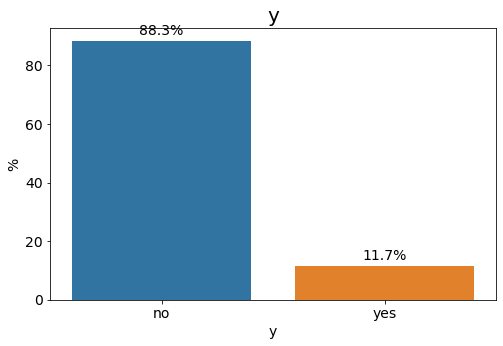

In [231]:
norm_target = (data.y.value_counts(normalize=True).mul(100).rename('percent').reset_index())

plt.figure(figsize=(8, 5))
ax = sns.barplot(x='index', y='percent', data=norm_target)

format_plot(ax)

plt.title('y', fontsize=20)

plt.xlabel('y', fontsize=14)
plt.ylabel('%', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

There is an imbalance in the classes of the target variable - y (the client made a deposit) in the dataset, this should be taken into account when training the model.

Let's analyze the rest of the categorical variables:

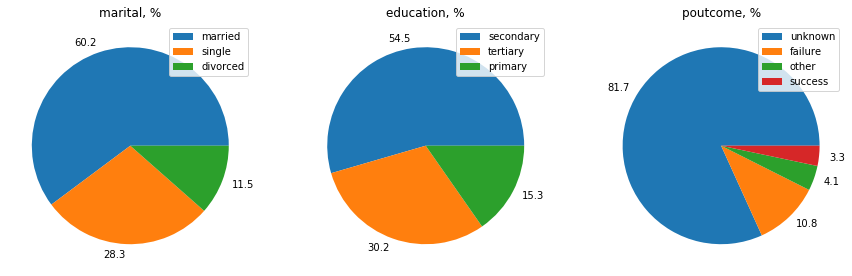

In [130]:
fig, ax = plt.subplots(1, 3, figsize = (15,7))

# Create apie chart of marital on the first axis
marital = round(data['marital'].value_counts(normalize=True).mul(100), 1)
ax[0].pie(marital, labels=marital)
ax[0].set_title('marital, %')
ax[0].legend(marital.keys().tolist())

# Create a pie chart of education on the second axis
education = round(data['education'].value_counts(normalize=True).mul(100), 1)
ax[1].pie(education, labels=education)
ax[1].set_title('education, %')
ax[1].legend(education.keys().tolist())

# Create a pie chart of poutcome on the 3 axis
poutcome = round(data['poutcome'].value_counts(normalize=True).mul(100), 1)
ax[2].pie(poutcome, labels=poutcome)
ax[2].set_title('poutcome, %')
ax[2].legend(poutcome.keys().tolist())


# Show the figure
fig.show()

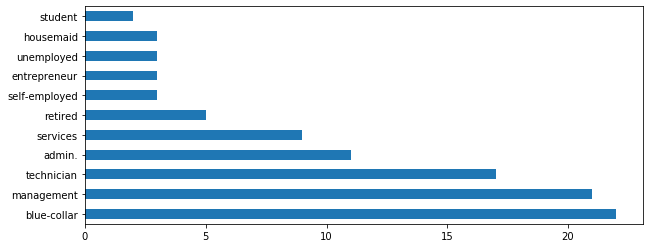

In [144]:
#plot the bar graph of percentage job categories
round(data.job.value_counts(normalize=True).mul(100)).plot.barh(figsize = (10,4))
plt.show()

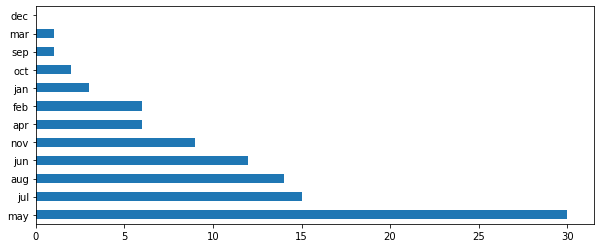

In [147]:
#plot the bar graph of percentage month
round(data.month.value_counts(normalize=True).mul(100)).plot.barh(figsize = (10,4))
plt.show()

It can be seen from the graphs that the majority of clients are married, with a secondary education, have not previously participated in a marketing company, the type of work is blue-collar. Also, the largest number of recent contacts for the year with clients was in May.

Let's analyze the distribution of numerical variables using a histogram. Estimation of outliers using box plot.

# age

Minimum:18.00
Mean:40.94
Median:39.00
Mode:32.00
Maximum:95.00



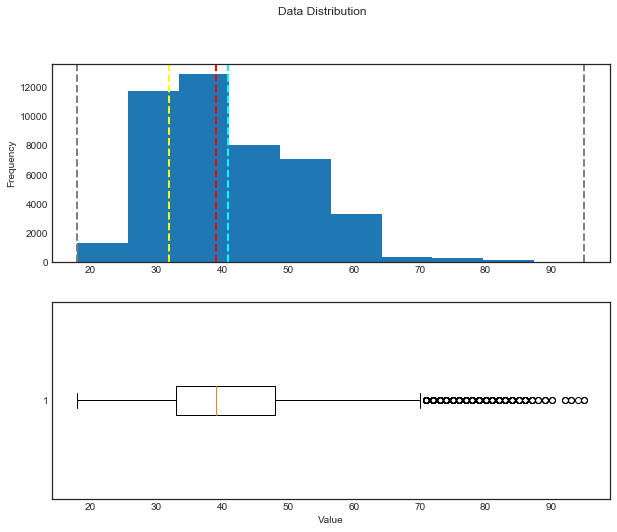

In [19]:
# Create a function that we can re-use 
def show_distribution(var_data):

    # Get statistics
    min_val = var_data.min()
    max_val = var_data.max()
    mean_val = var_data.mean()
    med_val = var_data.median()
    mod_val = var_data.mode()[0]

    print('Minimum:{:.2f}\nMean:{:.2f}\nMedian:{:.2f}\nMode:{:.2f}\nMaximum:{:.2f}\n'.format(min_val,
                                                                                            mean_val,
                                                                                            med_val,
                                                                                            mod_val,
                                                                                            max_val))

    fig, ax = plt.subplots(2, 1, figsize = (10,8))
  
    ax[0].hist(var_data)
    ax[0].set_ylabel('Frequency')

    ax[0].axvline(x=min_val, color = 'gray', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=mean_val, color = 'cyan', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=med_val, color = 'red', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=mod_val, color = 'yellow', linestyle='dashed', linewidth = 2)
    ax[0].axvline(x=max_val, color = 'gray', linestyle='dashed', linewidth = 2)

    # Plot the boxplot   
    ax[1].boxplot(var_data, vert=False)
    ax[1].set_xlabel('Value')

    fig.suptitle('Data Distribution')

    fig.show()

# Call the function
show_distribution(data['age'])

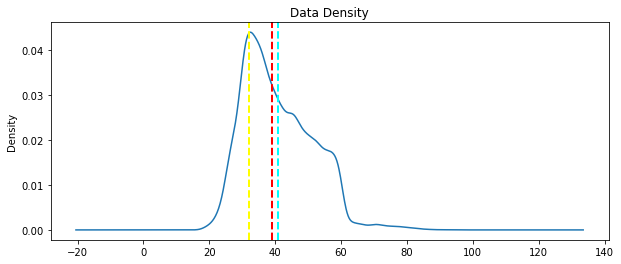

In [149]:
def show_density(var_data):
    from matplotlib import pyplot as plt

    fig = plt.figure(figsize=(10,4))

    # Plot density
    var_data.plot.density()

    plt.title('Data Density')

    # Show the mean, median, and mode
    plt.axvline(x=var_data.mean(), color = 'cyan', linestyle='dashed', linewidth = 2)
    plt.axvline(x=var_data.median(), color = 'red', linestyle='dashed', linewidth = 2)
    plt.axvline(x=var_data.mode()[0], color = 'yellow', linestyle='dashed', linewidth = 2)
    plt.show()

show_density(data['age'])

# balance

Minimum:-8019.00
Mean:1362.27
Median:448.00
Mode:0.00
Maximum:102127.00



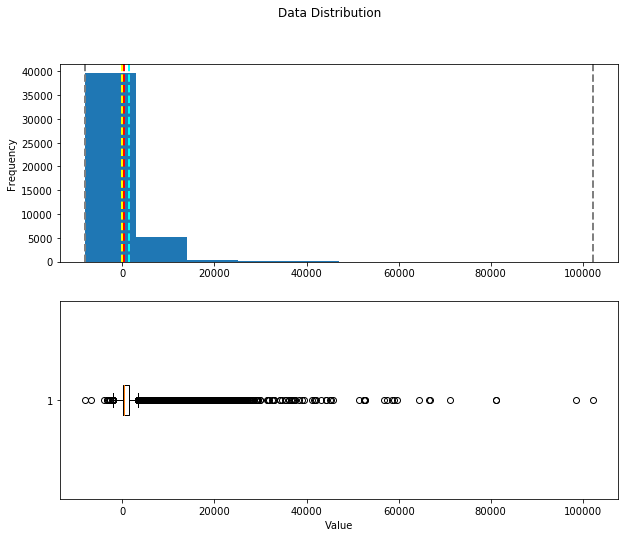

In [155]:
show_distribution(data['balance'])

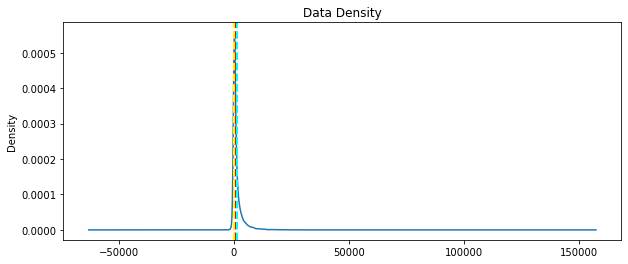

In [156]:
show_density(data['balance'])

# duration

Minimum:0.00
Mean:258.16
Median:180.00
Mode:124.00
Maximum:4918.00



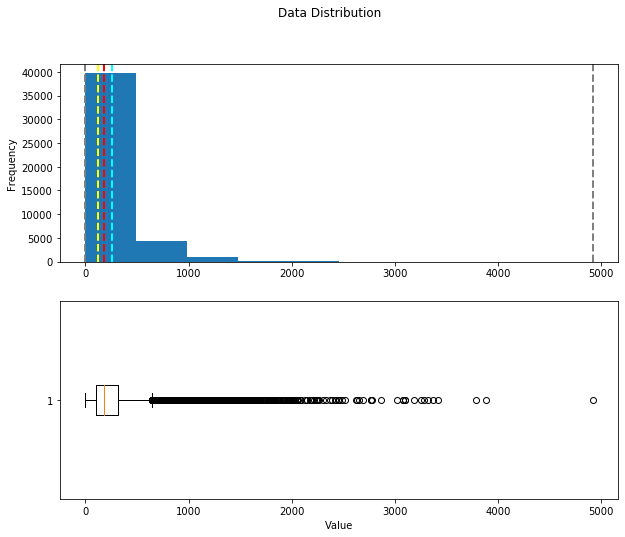

In [158]:
show_distribution(data['duration'])

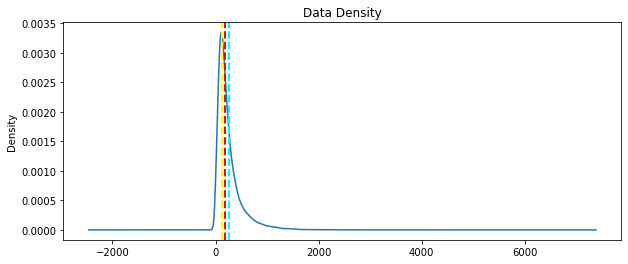

In [157]:
show_density(data['duration'])

In [159]:
data.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,balance_status,age_cat
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,middle,more50


# campaign

Minimum:1.00
Mean:2.76
Median:2.00
Mode:1.00
Maximum:63.00



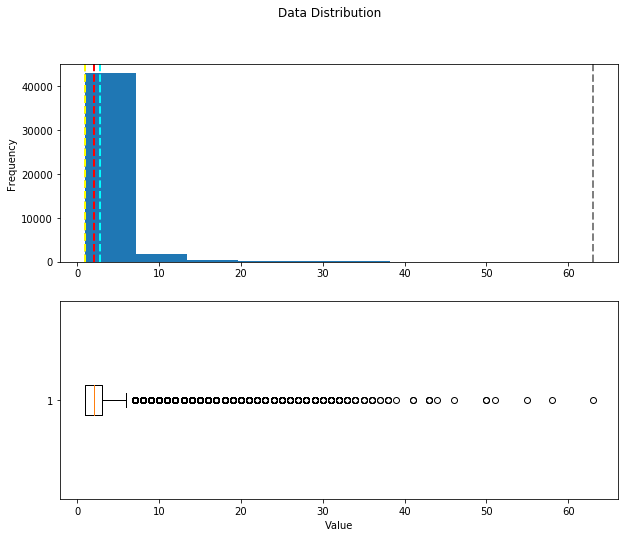

In [160]:
show_distribution(data['campaign'])

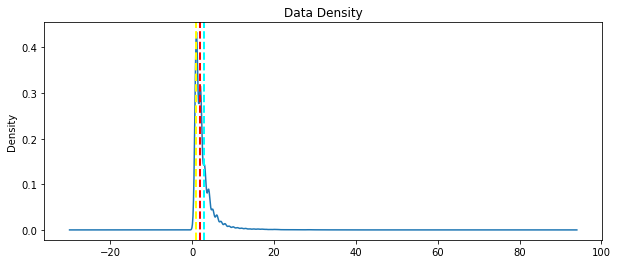

In [161]:
show_density(data['campaign'])

# pdays

Minimum:-1.00
Mean:40.20
Median:-1.00
Mode:-1.00
Maximum:871.00



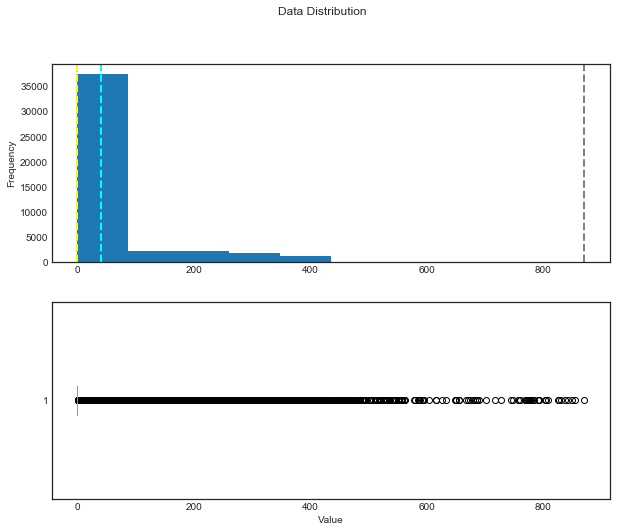

In [286]:
show_distribution(data['pdays'])

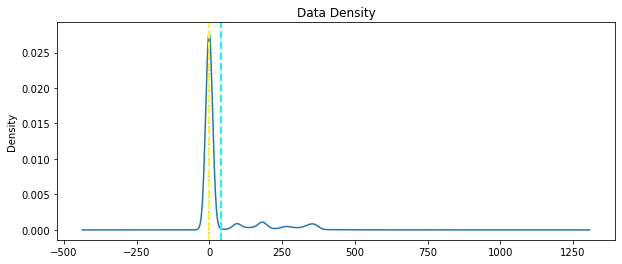

In [163]:
show_density(data['pdays'])

# previous

Minimum:0.00
Mean:0.58
Median:0.00
Mode:0.00
Maximum:275.00



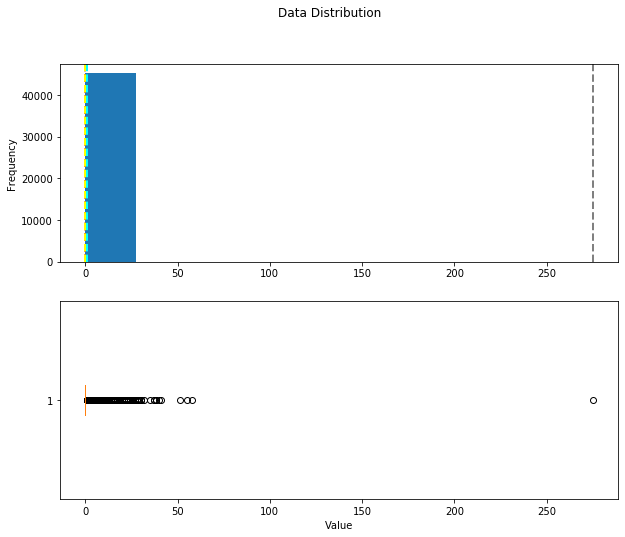

In [164]:
show_distribution(data['previous'])

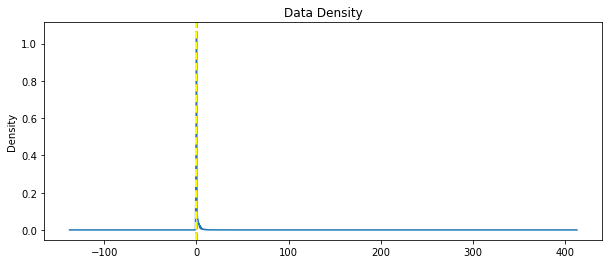

In [165]:
show_density(data['previous'])

From the graphs, we can conclude that the numerical variables have outliers and are not normally distributed.

# 2.2 Multivariate Analysis

Let's analyze the influence of numerical variables between each other using the Scatter plot and the correlation matrix.

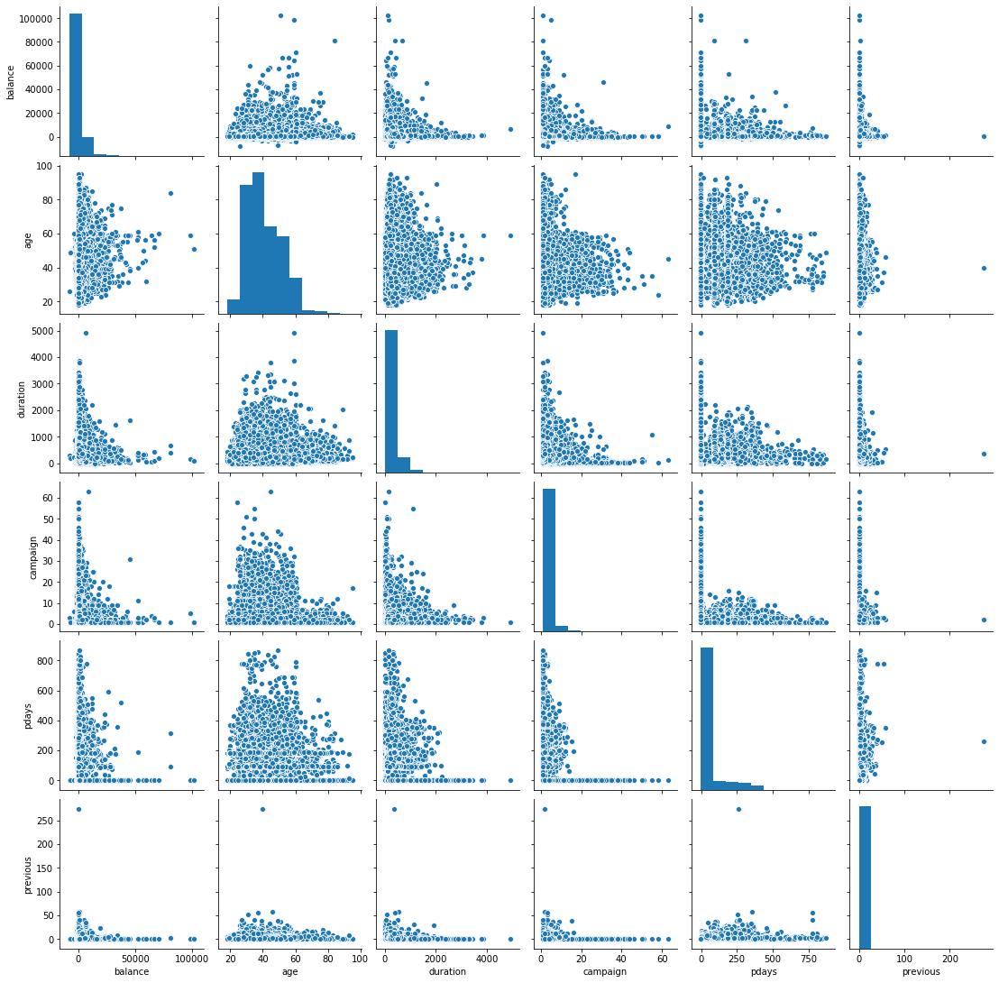

In [170]:
#plot the pair plot of numeric variables
num_cols = ['balance','age', 'duration', 'campaign', 'pdays', 'previous']
sns.pairplot(data = data, vars=num_cols)
plt.show()

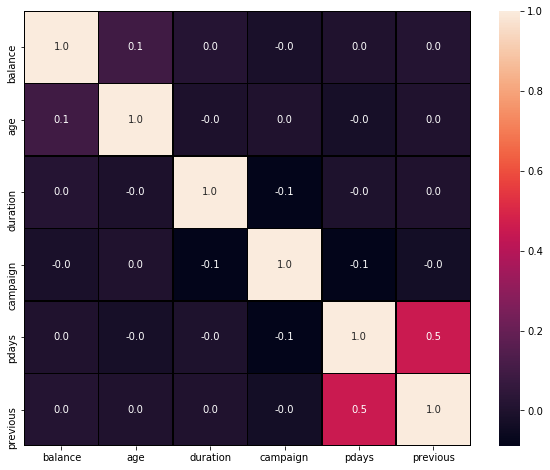

In [176]:
f,ax=plt.subplots(figsize=(10,8))
sns.heatmap(data[num_cols].corr(),annot=True,linewidths=0.5,linecolor="black",fmt=".1f",ax=ax)
plt.show()

The features pdays (number of days since the last contact with a client in the previous campaign) and previous (number of contacts with a client made before the current campaign) are highly correlated.

Numerical - Categorical analysis:

balance - y

In [180]:
data.groupby('y')['balance'].median()

y
no     417
yes    733
Name: balance, dtype: int64

In [181]:
data.groupby('y')['balance'].mean()

y
no     1303.714969
yes    1804.267915
Name: balance, dtype: float64

The average value and median of the balance are lower for clients who have not made a deposit.

balance - education - y

In [201]:
data.groupby('education')['balance'].mean()

education
primary      1259.069471
secondary    1171.294984
tertiary     1758.472064
Name: balance, dtype: float64

Clients with higher education have the highest average balance value.

In [11]:
fig = px.box(data, x='education', y='balance', color='y')
fig.update_traces(quartilemethod="exclusive") 
fig.show()

In the context of clients who have made a deposit, clients with higher education have a higher average balance.

balance-marital

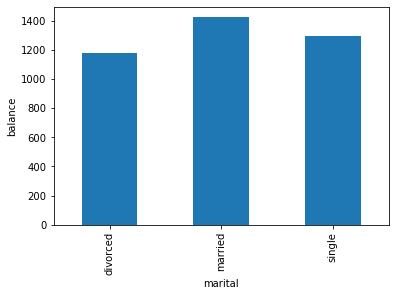

In [204]:
data.groupby('marital')['balance'].mean().plot(kind='bar') 
plt.ylabel('balance') 
plt.show();

Divorced clients have the lowest average balance, and married clients have the highest.

balance-default, balance-housing, balance-loan

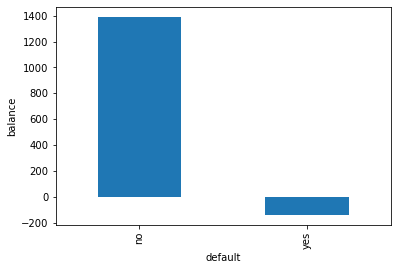

In [194]:
data.groupby('default')['balance'].mean().plot(kind='bar') 
plt.ylabel('balance') 
plt.show();

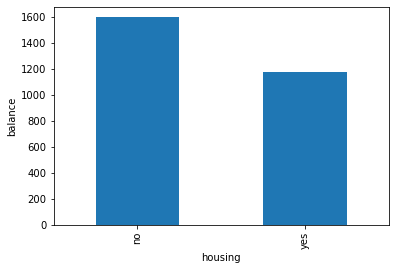

In [196]:
data.groupby('housing')['balance'].mean().plot(kind='bar') 
plt.ylabel('balance') 
plt.show();

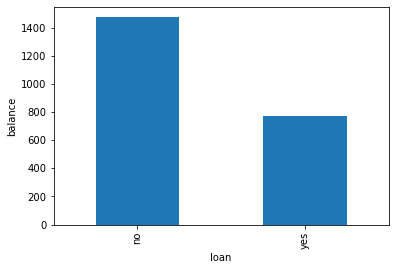

In [197]:
data.groupby('loan')['balance'].mean().plot(kind='bar') 
plt.ylabel('balance') 
plt.show();

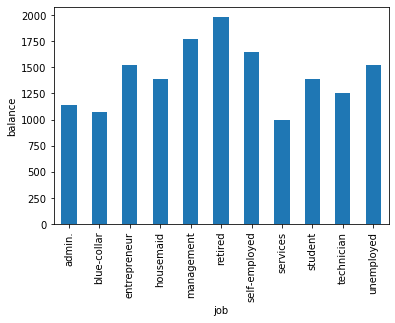

In [206]:
# balance - job
data.groupby('job')['balance'].mean().plot(kind='bar') 
plt.ylabel('balance') 
plt.show();

The value of the balance directly affects the client's ability to make a deposit (the larger the balance, the more likely it is that the client will make a deposit).
Marital status: The impact of divorce has a significant impact on the balance sheet.
Education: The level of education also affects the amount of the potential client's balance.
Loans: Whether a potential customer has a loan has a significant impact on the balance sheet.
Customers with loans have lower average balances than customers without loans.
Occupational balance: Managers and retirees have the highest balance in their accounts.

duration - y 

In [183]:
data.groupby('y')['duration'].median()

y
no     164
yes    426
Name: duration, dtype: int64

In [184]:
data.groupby('y')['duration'].mean()

y
no     221.182806
yes    537.294574
Name: duration, dtype: float64

duration - job - y

In [12]:
fig = px.box(data, x='job', y='duration', color='y')
fig.update_traces(quartilemethod="exclusive") 
fig.show()

Leads who have not made a deposit have a shorter call duration.
Comparing the average, workers, entrepreneurs have a longer duration of calls, and students, pensioners have a shorter duration of calls on average.

age - y

In [199]:
data.groupby('y')['age'].mean()

y
no     40.838986
yes    41.670070
Name: age, dtype: float64

In [200]:
data.groupby('y')['age'].median()

y
no     39
yes    38
Name: age, dtype: int64

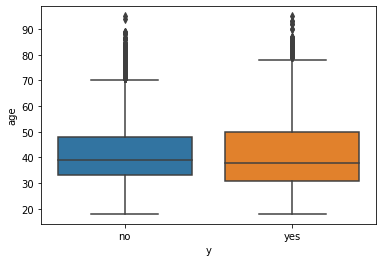

In [198]:
sns.boxplot(data.y, data.age)
plt.show()

The mean and median age do not differ between clients who made and did not make a deposit, but when analyzing Box Plot IQR for clients who made a deposit, it refers to the older ones.

In [13]:
fig = px.box(data, x='education', y='age', color='y')
fig.update_traces(quartilemethod="exclusive") 
fig.show()

Most of the clients made a deposit of older age with primary education.

campaign - y

In [207]:
data.groupby('y')['campaign'].mean()

y
no     2.846350
yes    2.141047
Name: campaign, dtype: float64

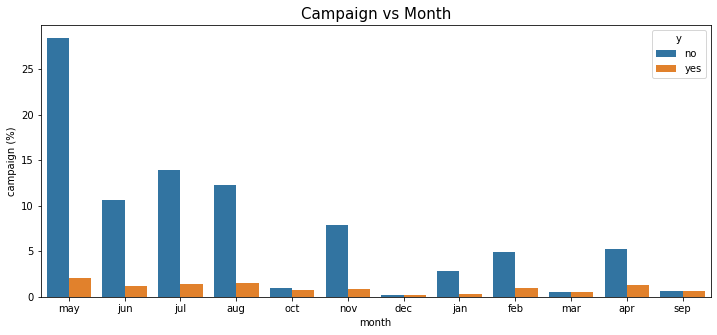

In [257]:
plt.figure(figsize=(12, 5))

ax = sns.barplot(x="month", y="campaign", hue='y', data=data,  estimator=lambda x: len(x) / len(data) * 100)
ax.set(ylabel="campaign (%)")
ax.set_xticklabels(data["month"].unique(), rotation=0, rotation_mode="anchor")

plt.title('Campaign vs Month', fontsize=15)
plt.show()

previous - poutcome

In [218]:
data.groupby('y')['previous'].mean()

y
no     0.502154
yes    1.170354
Name: previous, dtype: float64

In [214]:
data.groupby('poutcome')['previous'].mean()

poutcome
failure    2.896552
other      4.009239
success    3.075447
unknown    0.000460
Name: previous, dtype: float64

pdays - y

In [219]:
data.groupby('y')['pdays'].mean()

y
no     36.421372
yes    68.702968
Name: pdays, dtype: float64

The average number of contacts made during the current campaign with customers who made a deposit is less than the number of contacts with customers who did not make a deposit.
The campaign was mainly concentrated in the months of May, June and July.
According to the results of the previous campaign - the average number of contacts = 3 for a successful transaction.

Categorical − Categorical Analysis

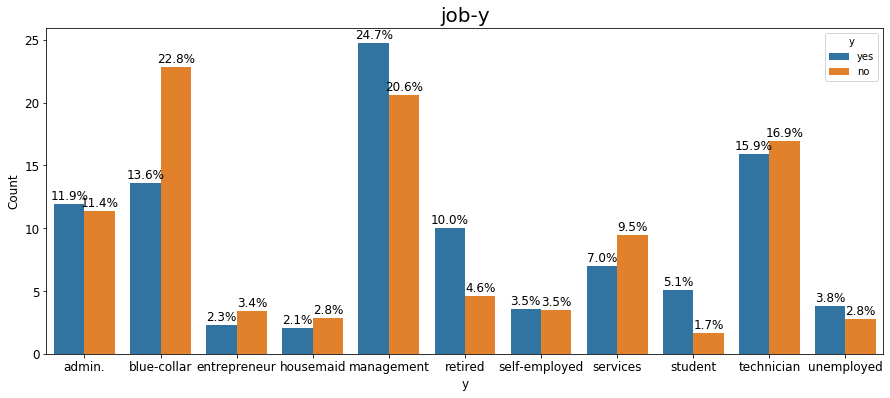

In [241]:
#job - y
plt.figure(figsize=(15, 6))

job_y = (data.groupby(['y'])['job'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('job'))

ax = sns.barplot(x="job", y="percentage", hue="y", data=job_y)
format_plot(ax)

plt.title('job-y', fontsize=20)
plt.ylabel('Count', fontsize=12)
plt.xlabel('y', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12);

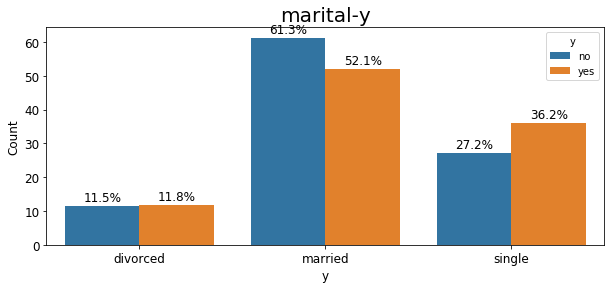

In [247]:
#marital - y
plt.figure(figsize=(10, 4))

job_y = (data.groupby(['y'])['marital'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('marital'))

ax = sns.barplot(x="marital", y="percentage", hue="y", data=job_y)
format_plot(ax)

plt.title('marital-y', fontsize=20)
plt.ylabel('Count', fontsize=12)
plt.xlabel('y', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12);

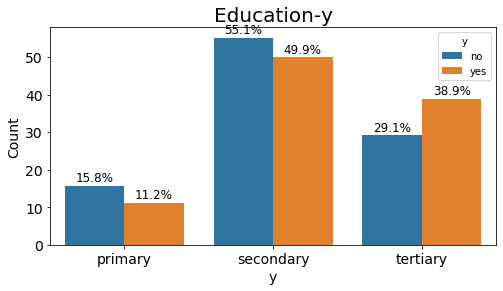

In [244]:
#education - y
plt.figure(figsize=(8, 4))

educ_y = (data.groupby(['y'])['education'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('education'))

ax = sns.barplot(x="education", y="percentage", hue="y", data=educ_y)
format_plot(ax)

plt.title('Education-y', fontsize=20)
plt.ylabel('Count', fontsize=14)
plt.xlabel('y', fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

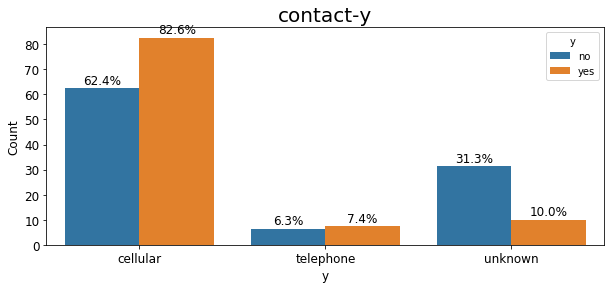

In [248]:
#contact - y
plt.figure(figsize=(10, 4))

job_y = (data.groupby(['y'])['contact'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('contact'))

ax = sns.barplot(x="contact", y="percentage", hue="y", data=job_y)
format_plot(ax)

plt.title('contact-y', fontsize=20)
plt.ylabel('Count', fontsize=12)
plt.xlabel('y', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12);

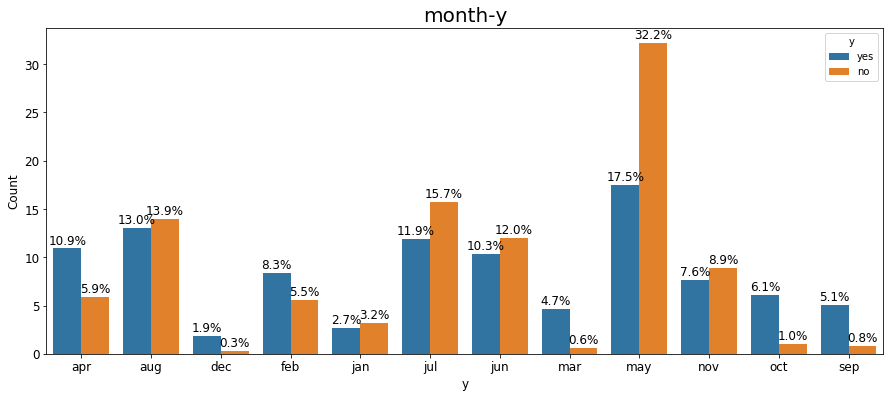

In [249]:
#month - y
plt.figure(figsize=(15, 6))

job_y = (data.groupby(['y'])['month'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('month'))

ax = sns.barplot(x="month", y="percentage", hue="y", data=job_y)
format_plot(ax)

plt.title('month-y', fontsize=20)
plt.ylabel('Count', fontsize=12)
plt.xlabel('y', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12);

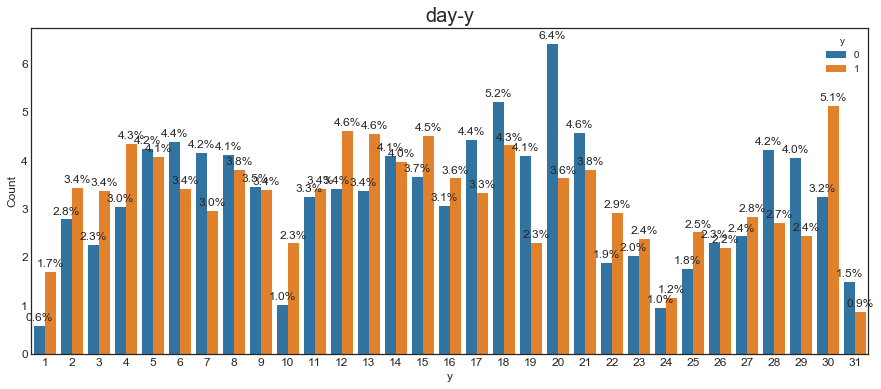

In [333]:
#day - y
plt.figure(figsize=(15, 6))

job_y = (data.groupby(['y'])['day'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('day'))

ax = sns.barplot(x="day", y="percentage", hue="y", data=job_y)
format_plot(ax)

plt.title('day-y', fontsize=20)
plt.ylabel('Count', fontsize=12)
plt.xlabel('y', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12);

It can be seen from the diagram that there is a trend by day: at the beginning of the month, the activity of the campaign is average, from the 12th to the 21st the activity increases, then decreases again. The largest number of issued deposits falls on the 30th. Perhaps this can be explained by the days of the week (working, weekends), but since the data does not contain information about the year of the campaign, it is not possible to determine the days of the week.

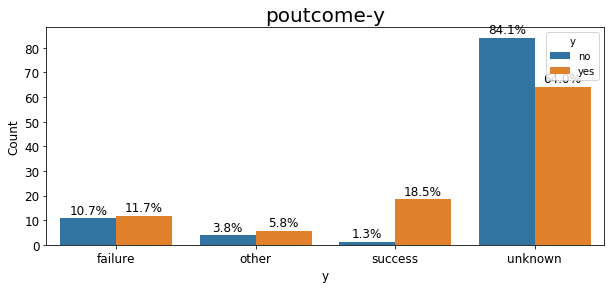

In [258]:
#poutcome - y
plt.figure(figsize=(10, 4))

job_y = (data.groupby(['y'])['poutcome'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('poutcome'))

ax = sns.barplot(x="poutcome", y="percentage", hue="y", data=job_y)
format_plot(ax)

plt.title('poutcome-y', fontsize=20)
plt.ylabel('Count', fontsize=12)
plt.xlabel('y', fontsize=12)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12);

Analyzing the diagrams of categorical features, we can draw the following conclusions:
1. job - type of work: workers (blue-collar) made the most deposits, followed by managers and technical specialties, but managers also had a large number of refusals.
2. marital - marital status: divorced leads made deposits the least, more deposits were made by married clients, but among married clients there is more than % of those who refused, and among singles, on the contrary, there are more of those who did.
3. education - the level of education: most of all leads who made a deposit have secondary education, but there are also many refusals among them, in second place is higher education, where there are more depositors, less willing to make leads with primary education.
4. contact - type of connection: leads with a cell phone most of all agreed to deposit, with unknown type they refused.
5. month - months of marketing activity: the month of the highest level of marketing activity was May. However, this month, potential clients tended to turn down the offer. For the next marketing campaign, it would be expedient for the bank to focus the marketing campaign on March, April, September, October.
6. poutcome - the result of the previous marketing campaign: % of clients who made a deposit exceeds % of those who did not, if the client participated in the previous campaign, even if it was unsuccessful.

In [310]:
#create y of numerical data type where y "yes"= 1, "no"= 0
data['y'] = np.where(data.y=='yes',1,0)
data.y.value_counts()

0    39922
1     5289
Name: y, dtype: int64

Let's analyze the influence of several categorical features on the target variable using a pivot table and a heat map.

marital    divorced   married    single
education                              
primary    0.137203  0.075786  0.105937
secondary  0.104351  0.095521  0.132265
tertiary   0.140013  0.131139  0.182079


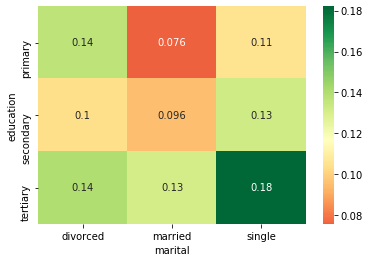

In [260]:
marital_ed = pd.pivot_table(data=data, index='education', columns='marital',values='y')
print(marital_ed)

#create heat map of education vs marital vs response_rate
sns.heatmap(marital_ed, annot=True, cmap = 'RdYlGn', center=0.117)
plt.show()

Based on the heat map, we can conclude that married people with elementary education are less likely to enroll, while single people with college education are more likely to accept.

education       primary  secondary  tertiary
job                                         
admin.         0.057416   0.118451  0.173077
blue-collar    0.058294   0.080692  0.163399
entrepreneur   0.065574   0.096892  0.076618
housemaid      0.078987   0.085859  0.127168
management     0.071197   0.088210  0.146586
retired        0.219632   0.211685  0.264398
self-employed  0.038462   0.074010  0.160138
services       0.084058   0.087330  0.123762
student        0.363636   0.290419  0.261062
technician     0.082278   0.098885  0.145325
unemployed     0.132296   0.147952  0.193772


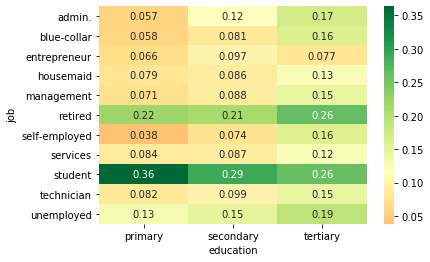

In [263]:
job_ed = pd.pivot_table(data=data, index='job', columns='education',values='y')
print(job_ed)

#create heat map of education vs marital vs response_rate
sns.heatmap(job_ed, annot=True, cmap = 'RdYlGn', center=0.117)
plt.show()

Among leads with different types of work and education, most students with primary education make deposits, as well as pensioners with higher education.

marital        divorced   married    single
job                                        
admin.         0.120000  0.113628  0.135995
blue-collar    0.078353  0.062909  0.107474
entrepreneur   0.083799  0.075701  0.113445
housemaid      0.097826  0.073465  0.166667
management     0.127469  0.125390  0.162244
retired        0.277523  0.216512  0.115044
self-employed  0.157143  0.079557  0.192825
services       0.091075  0.073951  0.117696
student        0.166667  0.185185  0.293850
technician     0.083243  0.102665  0.132443
unemployed     0.157895  0.132695  0.194514


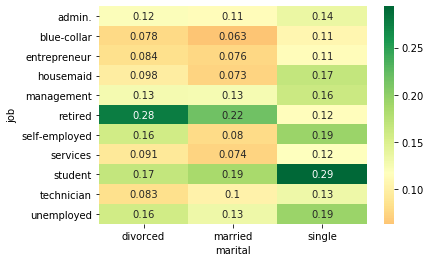

In [264]:
job_mar = pd.pivot_table(data=data, index='job', columns='marital',values='y')
print(job_mar)

#create heat map of education vs marital vs response_rate
sns.heatmap(job_mar, annot=True, cmap = 'RdYlGn', center=0.117)
plt.show()

Divorced pensioners and single students make the most deposits among leads with different specialties and marital status.

# 3. Feature engineering

# 3.1. Handling outliers and drop correlated features

Let's remove outliers from numeric variables using the IQR method.

In [14]:
numerical_features=['age', 'duration', 'balance']

In [15]:
for cols in numerical_features:
    Q1 = dt[cols].quantile(0.25)
    Q3 = dt[cols].quantile(0.75)
    IQR = Q3 - Q1     

    filter = (dt[cols] >= Q1 - 1.5 * IQR) & (dt[cols] <= Q3 + 1.5 *IQR)
    dt=dt.loc[filter]

Text(0.5, 1.0, 'balance')

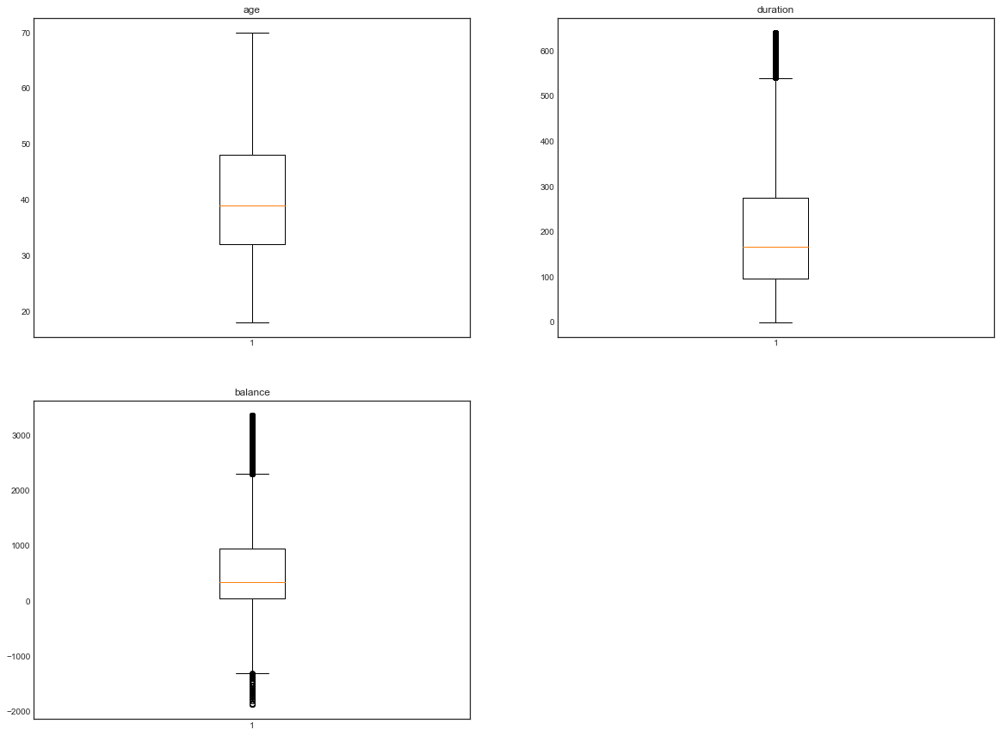

In [16]:
plt.figure(figsize = (20, 15))
plt.style.use('seaborn-white')
ax=plt.subplot(221)
plt.boxplot(dt['age'])
ax.set_title('age')
ax=plt.subplot(222)
plt.boxplot(dt['duration'])
ax.set_title('duration')
ax=plt.subplot(223)
plt.boxplot(dt['balance'])
ax.set_title('balance')


Let's create a new variable campaign_old_new - the total number of contacts with the client during the previous and current campaigns:

In [17]:
dt['campaign_old_new'] = dt['campaign'] + dt['previous']
dt.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,campaign_old_new
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,1


Minimum:1.00
Mean:3.36
Median:2.00
Mode:1.00
Maximum:277.00



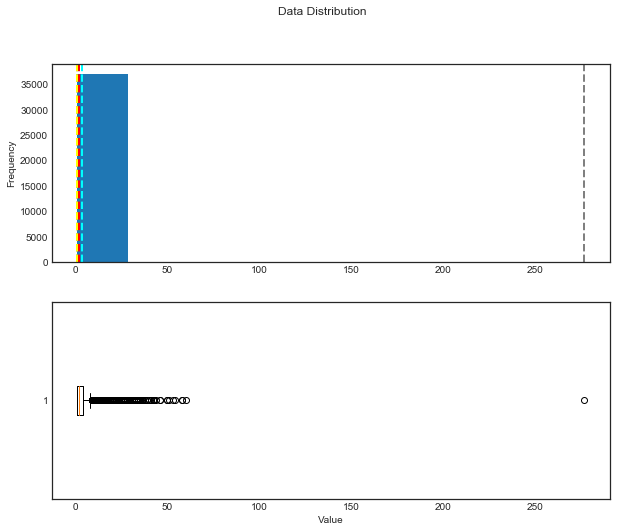

In [20]:
show_distribution(dt['campaign_old_new'])

The value 277 is clearly an outlier. Remove all values > 50:

{'whiskers': [<matplotlib.lines.Line2D at 0x22cb4bc4fd0>,
 'caps': [<matplotlib.lines.Line2D at 0x22cb4bd1780>,
 'boxes': [<matplotlib.lines.Line2D at 0x22cb4bc4e48>],
 'medians': [<matplotlib.lines.Line2D at 0x22cb4bd1e80>],
 'fliers': [<matplotlib.lines.Line2D at 0x22cb4bda240>],
 'means': []}

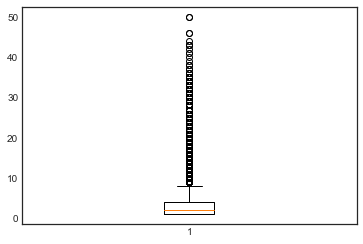

In [21]:
dt = dt[dt.campaign_old_new <= 50]

plt.boxplot(dt['campaign_old_new'])

Check the correlation matrix with a new variable:

In [22]:
num_cols = ['balance', 'age', 'duration', 'campaign', 'pdays', 'previous', 'campaign_old_new']

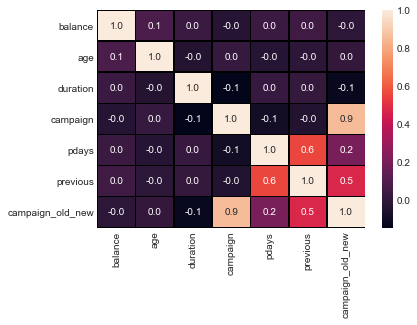

In [23]:
f,ax=plt.subplots(figsize=(6,4))
sns.heatmap(dt[num_cols].corr(),annot=True,linewidths=0.5,linecolor="black",fmt=".1f",ax=ax)
plt.show()

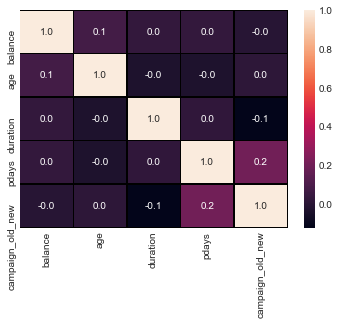

In [24]:
# remove correlated variables
dt = dt.drop(['campaign', 'previous'], axis=1, inplace=False)

num_cols2 = ['balance', 'age', 'duration', 'pdays', 'campaign_old_new']

f,ax=plt.subplots(figsize=(6,4))
sns.heatmap(dt[num_cols2].corr(),annot=True,linewidths=0.5,linecolor="black",fmt=".1f",ax=ax)
plt.show()

By replacing the 'campaign' and 'previous' features with a new 'campaign_old_new variable', we got rid of the correlation between 'pdays' and 'previous'.

# 3.2 Standardization of numerical variables

In [25]:
# replace the value -1 with 0 (the number of days since the last contact, if there was no contact)
dt['pdays'] = np.where(dt.pdays == -1, 0, dt.pdays)
dt['pdays'].value_counts()

0      30478
182      123
92       110
91       101
370       90
       ...  
464        1
470        1
54         1
528        1
831        1
Name: pdays, Length: 533, dtype: int64

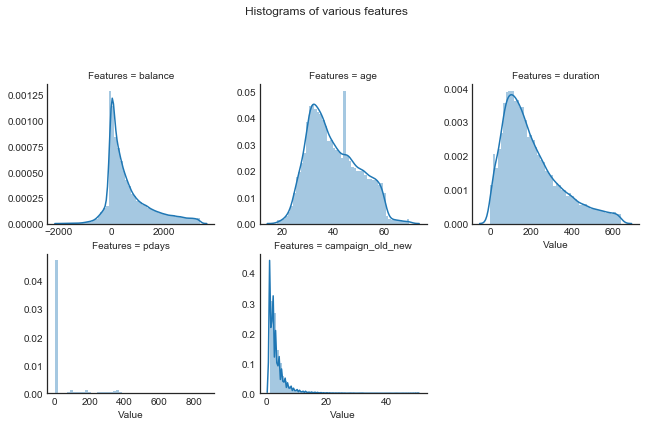

In [26]:
numeric_features = dt[num_cols2]

numeric_features = numeric_features.stack().reset_index().rename(
    columns={"level_1": "Features", 0: "Value"})

ax = sns.FacetGrid(data=numeric_features, col="Features",
                  col_wrap=3, sharex=False, sharey=False)
ax = ax.map(sns.distplot, "Value")

plt.subplots_adjust(top=0.8)
plt.suptitle("Histograms of various features");

In [27]:
scaler = StandardScaler()

# Create a new dataframe for the scaled values
dt_scaled = dt.copy()
# Normalize the numeric columns
dt_scaled[num_cols2] = scaler.fit_transform(dt_scaled[num_cols2])
dt_scaled.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,pdays,poutcome,y,campaign_old_new
0,1.793554,management,married,tertiary,no,1.850429,yes,no,unknown,5,may,0.422841,-0.408243,unknown,no,-0.659897


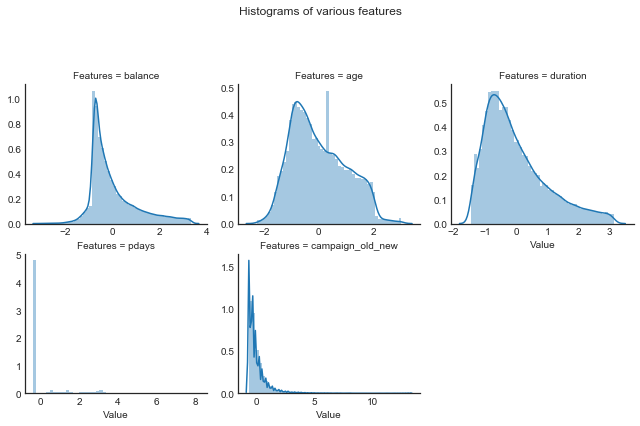

In [28]:
numeric_features = dt_scaled[num_cols2]

numeric_features = numeric_features.stack().reset_index().rename(
    columns={"level_1": "Features", 0: "Value"})

ax = sns.FacetGrid(data=numeric_features, col="Features",
                  col_wrap=3, sharex=False, sharey=False)
ax = ax.map(sns.distplot, "Value")

plt.subplots_adjust(top=0.8)
plt.suptitle("Histograms of various features");

In [372]:
dt_scaled.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,pdays,poutcome,y,campaign_old_new
0,1.793554,management,married,tertiary,no,1.850429,yes,no,unknown,5,may,0.422841,-0.408243,unknown,0,-0.659897


In [61]:
dt_enc  = dt_scaled.copy()

# 3.3 Encoding categorical variables

In [62]:
#create numerical data type where y "yes"= 1, "no"= 0 for 'default', 'housing', 'loan', y
dt_enc['default'] = np.where(dt_enc.default=='yes', 1, 0)
dt_enc['housing'] = np.where(dt_enc.housing=='yes', 1, 0)
dt_enc['loan'] = np.where(dt_enc.loan=='yes', 1, 0)
dt_enc['y'] = np.where(dt_enc.y=='yes',1,0)

dt_enc.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,pdays,poutcome,y,campaign_old_new
0,1.793554,management,married,tertiary,0,1.850429,1,0,unknown,5,may,0.422841,-0.408243,unknown,0,-0.659897
1,0.375924,technician,single,secondary,0,-0.718094,1,0,unknown,5,may,-0.364292,-0.408243,unknown,0,-0.659897
2,-0.737928,entrepreneur,married,secondary,0,-0.750900,1,1,unknown,5,may,-0.900974,-0.408243,unknown,0,-0.659897
3,0.679702,blue-collar,married,unknown,0,1.076470,1,0,unknown,5,may,-0.786482,-0.408243,unknown,0,-0.659897
4,-0.737928,unknown,single,unknown,0,-0.752115,0,0,unknown,5,may,-0.027972,-0.408243,unknown,0,-0.659897


In [63]:
cat_cols = ['education', 'job', 'marital', 'month']
bin_cat = ['poutcome', 'contact']

Encoding the categorical variables 'poutcome', 'contact' into binary ones (OneHotEncoding) and the rest using Target encoding.

Splitting the data into 2 sets: training and test  before encoding categorical variables  to avoid leakage. Also, for analysis, we changed the "unknown" values in the job variable to fashion depending on the balance and age of the client, and in education - depending on the balance and type of work of the client. Let's make a replacement for unknown separately in the training and test sets.

In [64]:
dt_enc.job.value_counts()

blue-collar      8249
management       7529
technician       6357
admin.           4443
services         3560
retired          1443
self-employed    1272
entrepreneur     1239
unemployed       1031
housemaid        1005
student           790
unknown           225
Name: job, dtype: int64

In [65]:
X = dt_enc.drop('y', axis=1)
y = dt_enc['y']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, stratify=y, shuffle=True, random_state=RAND)

In [66]:
# Create a Balance Category
X_train['balance_status'] = np.nan
lst = [X_train]

bal_cat(lst)
  
# balance by balance_status
negative = X_train['balance'].loc[X_train['balance_status'] == "negative"].values.tolist()
low = X_train['balance'].loc[X_train['balance_status'] == "low"].values.tolist()
middle = X_train['balance'].loc[X_train['balance_status']== "middle"].values.tolist()
high = X_train['balance'].loc[X_train['balance_status'] == "high"].values.tolist()

# Create an Age Category
X_train['age_cat'] = np.nan
lst = [X_train]

age_cat(lst)
    
X_train['age'].loc[X_train['age_cat'] == "18-30"].values.tolist()
X_train['age'].loc[X_train['age_cat'] == "31-40"].values.tolist()
X_train['age'].loc[X_train['age_cat']== "41-50"].values.tolist()
X_train['age'].loc[X_train['age_cat'] == "more50"].values.tolist()
X_train.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,pdays,poutcome,campaign_old_new,balance_status,age_cat
20269,1.894813,retired,married,secondary,0,1.652383,0,0,cellular,11,aug,-0.120997,-0.408243,unknown,-0.378338,low,18-30


In [67]:
# Create a Balance Category
X_test['balance_status'] = np.nan
lst = [X_test]

bal_cat(lst)
  
# balance by balance_status
negative = X_test['balance'].loc[X_test['balance_status'] == "negative"].values.tolist()
low = X_test['balance'].loc[X_test['balance_status'] == "low"].values.tolist()
middle = X_test['balance'].loc[X_test['balance_status']== "middle"].values.tolist()
high = X_test['balance'].loc[X_test['balance_status'] == "high"].values.tolist()

# Create an Age Category
X_test['age_cat'] = np.nan
lst = [X_test]

age_cat(lst)
    
X_test['age'].loc[X_test['age_cat'] == "18-30"].values.tolist()
X_test['age'].loc[X_test['age_cat'] == "31-40"].values.tolist()
X_test['age'].loc[X_test['age_cat']== "41-50"].values.tolist()
X_test['age'].loc[X_test['age_cat'] == "more50"].values.tolist()
X_test.head(1)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,pdays,poutcome,campaign_old_new,balance_status,age_cat
36722,-0.737928,technician,single,tertiary,0,-0.515188,1,0,cellular,12,may,-0.135308,-0.408243,unknown,0.466339,negative,18-30


In [68]:
X_train['job_mode'] = X_train.groupby(['age_cat', 'balance_status'])['job'].transform(lambda x: x.mode()[0])
X_train['job'] = X_train[['job', 'job_mode']].apply(lambda x: x[1] if x[0] == 'unknown' else x[0], axis=1)

X_test['job_mode'] = X_test.groupby(['age_cat', 'balance_status'])['job'].transform(lambda x: x.mode()[0])
X_test['job'] = X_test[['job', 'job_mode']].apply(lambda x: x[1] if x[0] == 'unknown' else x[0], axis=1)
X_train.job.value_counts(normalize=True)

blue-collar      0.225114
management       0.205981
technician       0.170191
admin.           0.120042
services         0.094734
retired          0.039128
self-employed    0.035216
entrepreneur     0.032631
unemployed       0.027569
housemaid        0.027498
student          0.021898
Name: job, dtype: float64

In [69]:
X_train['education_mode'] = X_train.groupby(['job', 'balance_status'])['education'].transform(lambda x: x.mode()[0])
X_train['education'] = X_train[['education', 'education_mode']].apply(lambda x: x[1] if x[0] == 'unknown' else x[0], axis=1)

X_test['education_mode'] = X_test.groupby(['job', 'balance_status'])['education'].transform(lambda x: x.mode()[0])
X_test['education'] = X_test[['education', 'education_mode']].apply(lambda x: x[1] if x[0] == 'unknown' else x[0], axis=1)
X_test.education.value_counts(normalize=True)

secondary    0.560952
tertiary     0.291083
primary      0.147965
Name: education, dtype: float64

In [70]:
# delete unnecessary variables
X_train = X_train.drop(['job_mode', 'education_mode', 'balance_status', 'age_cat'], axis=1, inplace=False)
X_test = X_test.drop(['job_mode', 'education_mode', 'balance_status', 'age_cat'], axis=1, inplace=False)
X_train.shape, X_test.shape

((27857, 15), (9286, 15))

In [71]:
# OneHotEncoding for 'poutcome', 'contact'
encoder = ce.OneHotEncoder(
    cols=bin_cat,  
    use_cat_names=True   
).fit(X_train[bin_cat])

In [72]:
X_train = pd.concat([X_train, encoder.transform(X_train[bin_cat])], axis=1)
X_test = pd.concat([X_test, encoder.transform(X_test[bin_cat])], axis=1)

X_train.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,...,pdays,poutcome,campaign_old_new,poutcome_unknown,poutcome_other,poutcome_failure,poutcome_success,contact_cellular,contact_unknown,contact_telephone
20269,1.894813,retired,married,secondary,0,1.652383,0,0,cellular,11,...,-0.408243,unknown,-0.378338,1,0,0,0,1,0,0
44419,-0.839187,management,married,tertiary,0,1.448261,0,0,cellular,4,...,1.386526,other,0.466339,0,1,0,0,1,0,0
6595,0.477183,blue-collar,married,primary,0,-0.965956,1,1,unknown,28,...,-0.408243,unknown,-0.378338,1,0,0,0,0,1,0
32227,-0.130372,blue-collar,married,primary,0,-0.185922,1,0,cellular,16,...,2.895315,failure,-0.378338,0,0,1,0,1,0,0
19590,-0.839187,technician,married,secondary,0,-0.571079,0,1,cellular,7,...,-0.408243,unknown,-0.378338,1,0,0,0,1,0,0


In [73]:
X_train.drop(bin_cat, axis=1, inplace=True)
X_test.drop(bin_cat, axis=1, inplace=True)

In [74]:
X_train.head()

,age,job,marital,education,default,balance,housing,loan,day,month,duration,pdays,campaign_old_new,poutcome_unknown,poutcome_other,poutcome_failure,poutcome_success,contact_cellular,contact_unknown,contact_telephone
20269,1.894813,retired,married,secondary,0,1.652383,0,0,11,aug,-0.120997,-0.408243,-0.378338,1,0,0,0,1,0,0
44419,-0.839187,management,married,tertiary,0,1.448261,0,0,4,aug,0.673292,1.386526,0.466339,0,1,0,0,1,0,0
6595,0.477183,blue-collar,married,primary,0,-0.965956,1,1,28,may,0.093676,-0.408243,-0.378338,1,0,0,0,0,1,0
32227,-0.130372,blue-collar,married,primary,0,-0.185922,1,0,16,apr,0.215324,2.895315,-0.378338,0,0,1,0,1,0,0
19590,-0.839187,technician,married,secondary,0,-0.571079,0,1,7,aug,0.208168,-0.408243,-0.378338,1,0,0,0,1,0,0


In [75]:
encoder = ce.TargetEncoder(min_samples_leaf=10, smoothing=30).fit(X_train[cat_cols], y_train)

X_train[cat_cols] = encoder.transform(X_train[cat_cols])
X_test[cat_cols] = encoder.transform(X_test[cat_cols])
X_train.head()

,age,job,marital,education,default,balance,housing,loan,day,month,duration,pdays,campaign_old_new,poutcome_unknown,poutcome_other,poutcome_failure,poutcome_success,contact_cellular,contact_unknown,contact_telephone
20269,1.894813,0.135780,0.065392,0.071968,0,1.652383,0,0,11,0.076284,-0.120997,-0.408243,-0.378338,1,0,0,0,1,0,0
44419,-0.839187,0.101255,0.065392,0.111369,0,1.448261,0,0,4,0.076284,0.673292,1.386526,0.466339,0,1,0,0,1,0,0
6595,0.477183,0.040982,0.065392,0.039197,0,-0.965956,1,1,28,0.035940,0.093676,-0.408243,-0.378338,1,0,0,0,0,1,0
32227,-0.130372,0.040982,0.065392,0.039197,0,-0.185922,1,0,16,0.148680,0.215324,2.895315,-0.378338,0,0,1,0,1,0,0
19590,-0.839187,0.073824,0.065392,0.071968,0,-0.571079,0,1,7,0.076284,0.208168,-0.408243,-0.378338,1,0,0,0,1,0,0


In [76]:
X_train.shape, X_test.shape

((27857, 20), (9286, 20))

# 4. Model building 

# 4.1 Model Selection

Comparing different algorithms for a classification problem using cross validation:

In [77]:
# Use Cross-validation.
# Logistic Regression
log_reg = LogisticRegression(class_weight='balanced')
log_scores = cross_val_score(log_reg, X_train, y_train, cv=3)
log_roc = cross_val_score(log_reg, X_train, y_train, cv=3, scoring='roc_auc')
log_f1 = cross_val_score(log_reg, X_train, y_train, cv=3, scoring='f1')
log_reg_mean_score = log_scores.mean()
log_reg_mean_roc = log_roc.mean()
log_reg_mean_f1 = log_f1.mean()

# SVC
svc_clf = SVC(class_weight='balanced')
svc_scores = cross_val_score(svc_clf, X_train, y_train, cv=3)
svc_roc = cross_val_score(svc_clf, X_train, y_train, cv=3, scoring='roc_auc')
svc_f1 = cross_val_score(svc_clf, X_train, y_train, cv=3, scoring='f1')
svc_mean_score = svc_scores.mean()
svc_mean_roc = svc_roc.mean()
svc_mean_f1 = svc_f1.mean()

# KNearestNeighbors
knn_clf = KNeighborsClassifier()
knn_scores = cross_val_score(knn_clf, X_train, y_train, cv=3)
knn_roc = cross_val_score(knn_clf, X_train, y_train, cv=3, scoring='roc_auc')
knn_f1 = cross_val_score(knn_clf, X_train, y_train, cv=3, scoring='f1')
knn_mean_score = knn_scores.mean()
knn_mean_roc = knn_roc.mean()
knn_mean_f1 = knn_f1.mean()

# Decision Tree
tree_clf = tree.DecisionTreeClassifier(class_weight='balanced')
tree_scores = cross_val_score(tree_clf, X_train, y_train, cv=3)
tree_roc = cross_val_score(tree_clf, X_train, y_train, cv=3, scoring='roc_auc')
tree_f1 = cross_val_score(tree_clf, X_train, y_train, cv=3, scoring='f1')
tree_mean_score = tree_scores.mean()
tree_mean_roc = tree_roc.mean()
tree_mean_f1 = tree_f1.mean()

# Gradient Boosting Classifier
grad_clf = GradientBoostingClassifier()
grad_scores = cross_val_score(grad_clf, X_train, y_train, cv=3)
grad_roc = cross_val_score(grad_clf, X_train, y_train, cv=3, scoring='roc_auc')
grad_f1 = cross_val_score(grad_clf, X_train, y_train, cv=3, scoring='f1')
grad_mean_score = grad_scores.mean()
grad_mean_roc = grad_roc.mean()
grad_mean_f1 = grad_f1.mean()


# Random Forest Classifier
rand_clf = RandomForestClassifier(class_weight='balanced', n_estimators=18)
rand_scores = cross_val_score(rand_clf, X_train, y_train, cv=3)
rand_roc = cross_val_score(rand_clf, X_train, y_train, cv=3, scoring='roc_auc')
rand_f1 = cross_val_score(rand_clf, X_train, y_train, cv=3, scoring='f1')
rand_mean_score = rand_scores.mean()
rand_mean_roc = rand_roc.mean()
rand_mean_f1 = rand_f1.mean()


# Naives Bayes
nav_clf = GaussianNB()
nav_scores = cross_val_score(nav_clf, X_train, y_train, cv=3)
nav_roc = cross_val_score(nav_clf, X_train, y_train, cv=3, scoring='roc_auc')
nav_f1 = cross_val_score(nav_clf, X_train, y_train, cv=3, scoring='f1')
nav_mean_score = nav_scores.mean()
nav_mean_roc = nav_roc.mean()
nav_mean_f1 = nav_f1.mean()


# Create a Dataframe with the results.
d = {'Classifiers': ['Logistic Reg.', 'SVC', 'KNN', 'Dec Tree', 'Grad B CLF', 'Rand FC',  'Naives Bayes'], 
    'Crossval Mean accuracy': [log_reg_mean_score, svc_mean_score, knn_mean_score, tree_mean_score, grad_mean_score, rand_mean_score,  nav_mean_score],
    'Crossval Mean roc_auc': [log_reg_mean_roc, svc_mean_roc, knn_mean_roc, tree_mean_roc, grad_mean_roc, rand_mean_roc,  nav_mean_roc],
    'Crossval Mean f1': [log_reg_mean_f1, svc_mean_f1, knn_mean_f1, tree_mean_f1, grad_mean_f1, rand_mean_f1,  nav_mean_f1]
    }

result_df = pd.DataFrame(data=d)
result_df = result_df.sort_values(by=['Crossval Mean roc_auc'], ascending=False)
result_df

,Classifiers,Crossval Mean accuracy,Crossval Mean roc_auc,Crossval Mean f1
4,Grad B CLF,0.936174,0.924780,0.468859
0,Logistic Reg.,0.832717,0.902370,0.431285
5,Rand FC,0.931112,0.900655,0.380824
1,SVC,0.811932,0.890730,0.403601
6,Naives Bayes,0.859963,0.843100,0.378527
2,KNN,0.925010,0.784116,0.332867
3,Dec Tree,0.905948,0.664819,0.384396


According to the accuracy metrics of the models, you can select the 3 best algorithms for further comparison: Gradient Boosting Classifier, Logistic Regression and Random Forest Classifier.

In [144]:
metrics = pd.DataFrame(
    index=['roc-auc_train', 'roc-auc_test', 'precision', 'recall', 'f1', 'logloss'])

In [145]:
# Gradient Boosting Classifier
grad_clf = GradientBoostingClassifier()

grad_clf.fit(X_train, y_train)

y_pred = grad_clf.predict(X_test)
y_score_train = grad_clf.predict_proba(X_train)[:,1]
y_score = grad_clf.predict_proba(X_test)[:,1]

fpr_gb, tpr_gb, thresholds_gb = roc_curve(y_test, y_score)

roc_auc_gb = auc(fpr_gb, tpr_gb)

metrics['Grad B CLF'] = [roc_auc_score(y_train, y_score_train), roc_auc_score(y_test, y_score),
                          precision_score(y_test, y_pred),
                          recall_score(y_test, y_pred),
                          f1_score(y_test, y_pred),
                          log_loss(y_test, y_pred)]
metrics

,Grad B CLF
roc-auc_train,0.936768
roc-auc_test,0.933002
precision,0.704261
recall,0.384932
f1,0.497786
logloss,2.108936


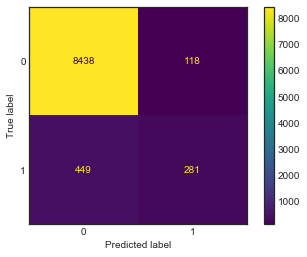

In [146]:
plot_confusion_matrix(grad_clf, X_test, y_test) 

In [149]:
# Random Forest Classifier
rand_clf = RandomForestClassifier(class_weight='balanced', n_estimators=18)

rand_clf.fit(X_train, y_train)

y_pred = rand_clf.predict(X_test)
y_score_train = rand_clf.predict_proba(X_train)[:,1]
y_score = rand_clf.predict_proba(X_test)[:,1]

fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_score)

roc_auc_rf = auc(fpr_rf, tpr_rf)

metrics['Rand FC'] = [roc_auc_score(y_train, y_score_train), roc_auc_score(y_test, y_score),
                          precision_score(y_test, y_pred),
                          recall_score(y_test, y_pred),
                          f1_score(y_test, y_pred),
                          log_loss(y_test, y_pred)]
metrics

,Grad B CLF,Rand FC
roc-auc_train,0.936768,0.999969
roc-auc_test,0.933002,0.907873
precision,0.704261,0.737705
recall,0.384932,0.308219
f1,0.497786,0.434783
logloss,2.108936,2.175883


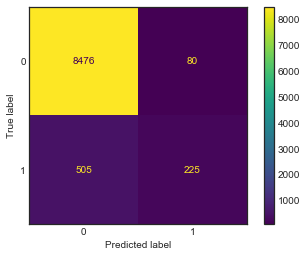

In [150]:
plot_confusion_matrix(rand_clf, X_test, y_test)

In [151]:
# Logistic Regression
log_reg = LogisticRegression(class_weight='balanced')

log_reg.fit(X_train, y_train)

y_pred = log_reg.predict(X_test)
y_score_train = log_reg.predict_proba(X_train)[:,1]
y_score = log_reg.predict_proba(X_test)[:,1]

fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test, y_score)

roc_auc_lr = auc(fpr_lr, tpr_lr)

metrics['Logistic Reg.'] = [roc_auc_score(y_train, y_score_train), roc_auc_score(y_test, y_score),
                          precision_score(y_test, y_pred),
                          recall_score(y_test, y_pred),
                          f1_score(y_test, y_pred),
                          log_loss(y_test, y_pred)]
metrics

,Grad B CLF,Rand FC,Logistic Reg.
roc-auc_train,0.936768,0.999969,0.904054
roc-auc_test,0.933002,0.907873,0.907795
precision,0.704261,0.737705,0.292262
recall,0.384932,0.308219,0.812329
f1,0.497786,0.434783,0.429866
logloss,2.108936,2.175883,5.850812


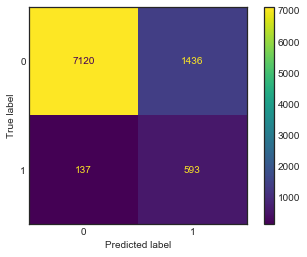

In [152]:
plot_confusion_matrix(log_reg, X_test, y_test)  
plt.show()

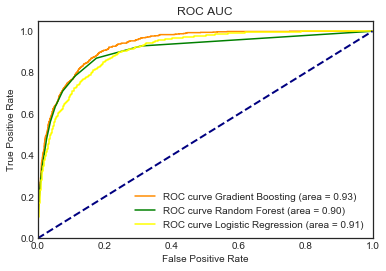

In [109]:
plt.plot(fpr_gb, tpr_gb, color='darkorange', label='ROC curve Gradient Boosting (area = %0.2f)' % roc_auc_gb)
plt.plot(fpr_rf, tpr_rf, color='green', label='ROC curve Random Forest (area = %0.2f)' % roc_auc_rf)
plt.plot(fpr_lr, tpr_lr, color='yellow', label='ROC curve Logistic Regression (area = %0.2f)' % roc_auc_lr)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('ROC AUC')
plt.legend(loc="lower right")
plt.show()

Among all the algorithms, the Gradient Boosting Classifier model showed the best metrics.

# 4.2 Feature Selection

Using the built-in feature selection method in the algorithm, we select the 15 most important features for the model:

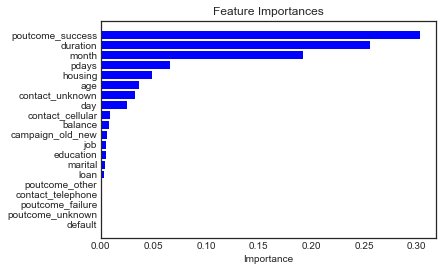

In [172]:
importances = grad_clf.feature_importances_
indices = np.argsort(importances)
features = X_train.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Importance')
plt.show()

In [155]:
X_train.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'day', 'month', 'duration', 'pdays', 'campaign_old_new',
       'poutcome_unknown', 'poutcome_other', 'poutcome_failure',
       'poutcome_success', 'contact_cellular', 'contact_unknown',
       'contact_telephone'],
      dtype='object')

In [156]:
X_train2 = X_train[['age', 'job', 'marital', 'education',  'balance', 'housing', 'loan', 'day', 'month', 'duration', 'pdays', 
                    'campaign_old_new', 'poutcome_success', 'contact_cellular', 'contact_unknown']]
X_test2 = X_test[['age', 'job', 'marital', 'education',  'balance', 'housing', 'loan', 'day', 'month', 'duration', 'pdays', 
                    'campaign_old_new', 'poutcome_success', 'contact_cellular', 'contact_unknown']]

Train the model on a new set of variables and compare the metrics:

In [157]:
grad_clf = GradientBoostingClassifier()

grad_clf.fit(X_train2, y_train)

y_pred = grad_clf.predict(X_test2)
y_score_train = grad_clf.predict_proba(X_train2)[:,1]
y_score = grad_clf.predict_proba(X_test2)[:,1]

# fpr_gb, tpr_gb, thresholds_gb = roc_curve(y_test, y_score)

# roc_auc_gb = auc(fpr_gb, tpr_gb)

metrics['Grad B CLF2'] = [roc_auc_score(y_train, y_score_train), roc_auc_score(y_test, y_score),
                          precision_score(y_test, y_pred),
                          recall_score(y_test, y_pred),
                          f1_score(y_test, y_pred),
                          log_loss(y_test, y_pred)]
metrics

,Grad B CLF,Rand FC,Logistic Reg.,Grad B CLF2
roc-auc_train,0.936768,0.999969,0.904054,0.937901
roc-auc_test,0.933002,0.907873,0.907795,0.934643
precision,0.704261,0.737705,0.292262,0.704715
recall,0.384932,0.308219,0.812329,0.389041
f1,0.497786,0.434783,0.429866,0.501324
logloss,2.108936,2.175883,5.850812,2.101497


# 4.3 Hyperparameter tuning

In [142]:
def objective(trial:optuna.trial.Trial):
    xgb_params = {
        'max_depth': trial.suggest_int("max_depth", 2, 10),
        'learning_rate': trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        'n_estimators': trial.suggest_int("n_estimators", 100, 5000),
        'min_samples_split': trial.suggest_int('min_samples_split', 1, 150),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 60),
        'subsample': trial.suggest_float("subsample", 0.2, 1.0),
    }
    
    xgb_tuna = GradientBoostingClassifier(random_state=42, **xgb_params)
    xgb_tuna.fit(X_train2, y_train)
    tuna_pred_test = xgb_tuna.predict_proba(X_test2)[:,1]
    return (roc_auc_score(y_test, tuna_pred_test)) 

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)
xgb_params = study.best_params

[I 2022-02-07 18:46:31,048] A new study created in memory with name: no-name-70182d7c-5d60-4efc-88f1-57f26f059967
[I 2022-02-07 18:48:56,071] Trial 0 finished with value: 0.9398664399572197 and parameters: {'max_depth': 3, 'learning_rate': 0.022342237642430603, 'n_estimators': 4444, 'min_samples_split': 36, 'min_samples_leaf': 29, 'subsample': 0.7369207564150067}. Best is trial 0 with value: 0.9398664399572197.
[I 2022-02-07 18:48:59,345] Trial 1 finished with value: 0.9197609464158774 and parameters: {'max_depth': 6, 'learning_rate': 0.0046108339451954895, 'n_estimators': 115, 'min_samples_split': 149, 'min_samples_leaf': 49, 'subsample': 0.2559605252373839}. Best is trial 0 with value: 0.9398664399572197.
[I 2022-02-07 18:49:06,868] Trial 2 finished with value: 0.8779424196430287 and parameters: {'max_depth': 4, 'learning_rate': 0.00018452668530775877, 'n_estimators': 186, 'min_samples_split': 67, 'min_samples_leaf': 9, 'subsample': 0.7004840964068328}. Best is trial 0 with value: 0.

Train the model on the selected hyperparameters and compare the metrics on the test set:

In [158]:
best_params = {'max_depth': 10, 
               'learning_rate': 0.0073729201593043065, 
               'n_estimators': 1557, 
               'min_samples_split': 54, 
               'min_samples_leaf': 42, 
               'subsample': 0.4061841457051314}

In [173]:
grad_clf = GradientBoostingClassifier(**best_params)

grad_clf.fit(X_train2, y_train)

y_pred = grad_clf.predict(X_test2)
y_score_train = grad_clf.predict_proba(X_train2)[:,1]
y_score = grad_clf.predict_proba(X_test2)[:,1]



metrics['Grad B CLF3'] = [roc_auc_score(y_train, y_score_train), roc_auc_score(y_test, y_score),
                          precision_score(y_test, y_pred),
                          recall_score(y_test, y_pred),
                          f1_score(y_test, y_pred),
                          log_loss(y_test, y_pred)]
metrics

,Grad B CLF,Rand FC,Logistic Reg.,Grad B CLF2,Grad B CLF3
roc-auc_train,0.936768,0.999969,0.904054,0.937901,0.975518
roc-auc_test,0.933002,0.907873,0.907795,0.934643,0.943921
precision,0.704261,0.737705,0.292262,0.704715,0.676660
recall,0.384932,0.308219,0.812329,0.389041,0.432877
f1,0.497786,0.434783,0.429866,0.501324,0.527987
logloss,2.108936,2.175883,5.850812,2.101497,2.101500


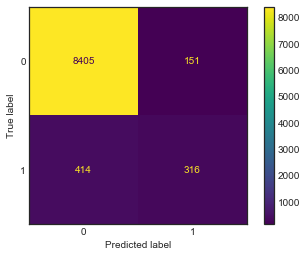

In [174]:
plot_confusion_matrix(grad_clf, X_test2, y_test)  
plt.show()

Model accuracy improved with 15 variables selected and hyperparameters fitted.
Let's compare the feature_importances of the final model with the SHAP plot, where we can analyze how much each feature contributes positively or negatively to the target variable.

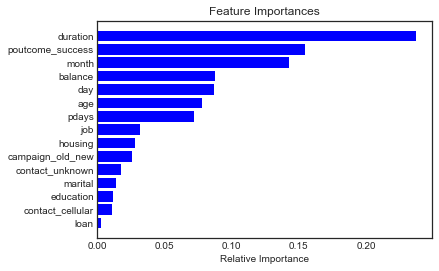

In [175]:
importances = grad_clf.feature_importances_
indices = np.argsort(importances)
features = X_train2.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

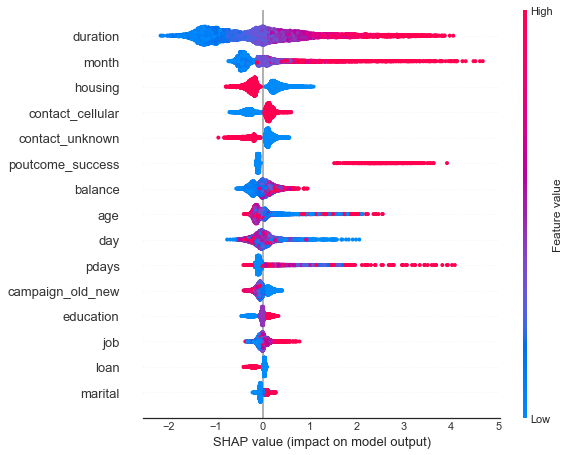

In [163]:
shap_test = shap.TreeExplainer(grad_clf).shap_values(X_test2)

shap.summary_plot(shap_test, X_test2, max_display=25, auto_size_plot=True)

The most important features are:
- duration - the longer the conversation with the lead, the more likely it is that he will make a deposit;
- housing - the presence of a housing loan negatively affects the possibility of making a deposit;
- contact_cellular - if the client has a cell phone type - a high probability of consent;
- contact_unknown - unknown phone type - high probability of rejection of the offer;
- poutcome_success - successful result of the previous marketing campaign has a positive effect on the result;
- balance - the larger the balance, the more likely it is to make a deposit;
- age - mostly younger and older clients make deposits;
- campaign_old_new - the number of contacts made during the previous and current campaign - a large number of contacts negatively affects the result;
- loan - the presence of a loan negatively affects the possibility of making a deposit.

# Solutions for the Next Marketing Campaign

1) Months of marketing activity. The month of the highest level of marketing activity was May. However, this month, potential clients tended to turn down offers of term deposits. For the next marketing campaign, it would be expedient for the bank to focus the marketing campaign on March, April, September, October.

2) Seasonality. Potential clients preferred to make term deposits in autumn and spring. The next marketing campaign should focus on these seasons.

3) Campaign Calls: The more we call the same potential client, the more likely he or she will refuse to open a term deposit.

4) Age category: The bank's next marketing campaign should target potential customers aged 20 and under and over 60.

5) Occupation. Workers and managers made the most deposits, and students and pensioners should also be taken into account.

6) Housing loans and balance sheets. Potential customers with low and no balances were more likely to have a home loan than those with medium and high balances. The next marketing campaign should be aimed at individuals with medium and high balances in order to increase the likelihood of signing up for a term deposit.

7) Marital status: the impact of divorce has a significant impact on the balance and on the outcome of the campaign.

8) If the client participated in a previous marketing campaign, he is more likely to make a deposit (especially if it was successful).